# *To Run this notebook in Colab:*

1.   Click the link to access the shared folder: https://drive.google.com/drive/folders/1UctrHFmqLgLtzKv2wJvScR67OCXLOfKi?usp=sharing
2.   When viewing in Google Drive, right-click on the owning folder (CMPE249_HW4) at the end of the breadcrumbs, near the top of the page.
Click 'Add Shortcut to Drive'. This should bring up a little Dropdown, and by default 'My Drive' should be highlighted (click it if it's not)
With 'My Drive' highlighted, click 'Add Shortcut'
3. At that point, you should be able to open the notebook CMPE249_Cesena_HW4_Part_1.ipynb and CMPE249_Cesena_HW4_Part_II. The notebook should run at this point, and the one colab-specific cell will bring up a dialog, asking to access your drive. Accept that and the rest of notebook should run.

# Option 1 / Part II (second model) - Perform Deep Learning based 2D object detection training and comparison (at least two models).

## 2.0 Second Model - mmDetection2D using KITTI dataset

### 2.1 Perform Imports & verify GPU status - note that it is best to restart the runtime before running the rest of the cells

In [ ]:
# only required if previous section was not run
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Check nvcc version
!nvcc -V
# Check GCC version
!gcc --version

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



### 2.2 Configure Pytorch and clone mmdetection into google drive

In [ ]:
# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install dependencies: (use cu111 because colab has CUDA 11.1)
!pip install torch==1.9.0+cu111 torchvision==0.10.0+cu111 -f https://download.pytorch.org/whl/torch_stable.html

# install mmcv-full thus we could use CUDA operators
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.9.0/index.html

# Install mmdetection
!rm -rf mmdetection
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection

!pip install -e .

# install Pillow 7.0.0 back in order to avoid bug in colab
#!pip install Pillow==7.0.0
!pip install Pillow

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/torch_stable.html
     |█████████████                   | 834.1 MB 1.4 MB/s eta 0:14:47tcmalloc: large alloc 1147494400 bytes == 0x39c88000 @  0x7fa5a0fa8615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |████████████████▌               | 1055.7 MB 1.3 MB/s eta 0:12:17tcmalloc: large alloc 1434370048 bytes == 0x7e2de000 @  0x7fa5a0fa8615 0x592b76 0x4df71e 0x59afff 0x515655 0x549576 0x593fce 0x548ae9 0x51566f 0x549576 0x593fce 0x548ae9 0x5127f1 0x598e3b 0x511f68 0x598e3b 0x511f68 0x598e3b 0x511f68 0x4bc98a 0x532e76 0x594b72 0x515600 0x549576 0x593fce 0x548ae9 0x5127f1 0x549576 0x593fce 0x5118f8 0x593dd7
     |█████

### 2.3 Mount drive to access kitti dataset

In [ ]:
%cd /content/mmdetection
!pwd

/content/mmdetection
/content/mmdetection


In [ ]:
# Check Pytorch installation
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())

# Check MMDetection installation
import mmdet
print(mmdet.__version__)

# Check mmcv installation
from mmcv.ops import get_compiling_cuda_version, get_compiler_version
print(get_compiling_cuda_version())
print(get_compiler_version())

1.9.0+cu111 True
2.25.1
11.1
GCC 7.3


### 2.4 Download pretrained weights

In [ ]:
# Download the pre-trained checkpoints for inference and finetuning.
!mkdir checkpoints
!wget -c https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
      -O checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth

--2022-08-19 00:59:46--  https://download.openmmlab.com/mmdetection/v2.0/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.254.187.167
Connecting to download.openmmlab.com (download.openmmlab.com)|47.254.187.167|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 167291982 (160M) [application/octet-stream]
Saving to: ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’

checkpoints/faster_ 100%[===================>] 159.54M  7.38MB/s    in 22s     

2022-08-19 01:00:09 (7.27 MB/s) - ‘checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth’ saved [167291982/167291982]



### 2.5 Set up configuration

In [ ]:
!pip install mmdet
import mmcv
from mmcv.runner import load_checkpoint

from mmdet.apis import inference_detector, show_result_pyplot
from mmdet.models import build_detector

# Choose to use a config and initialize the detector
config = 'configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py'
# Setup a checkpoint file to load
checkpoint = 'checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set the device to be used for evaluation
device='cuda:0'

# Load the config
config = mmcv.Config.fromfile(config)
# Set pretrained to be None since we do not need pretrained model here
config.model.pretrained = None

# Initialize the detector
model = build_detector(config.model)

# Load checkpoint
checkpoint = load_checkpoint(model, checkpoint, map_location=device)

# Set the classes of models for inference
model.CLASSES = checkpoint['meta']['CLASSES']

# We need to set the model's cfg for inference
model.cfg = config

# Convert the model to GPU
model.to(device)
# Convert the model into evaluation mode
model.eval()

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
load checkpoint from local path: checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth


FasterRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

### 2.6 Demo picture to verify setup and configu

In [ ]:
# Use the detector to do inference
img = 'demo/demo.jpg'
result = inference_detector(model, img)

/content/mmdetection/mmdet/datasets/utils.py:70: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  'data pipeline in your config file.', UserWarning)
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


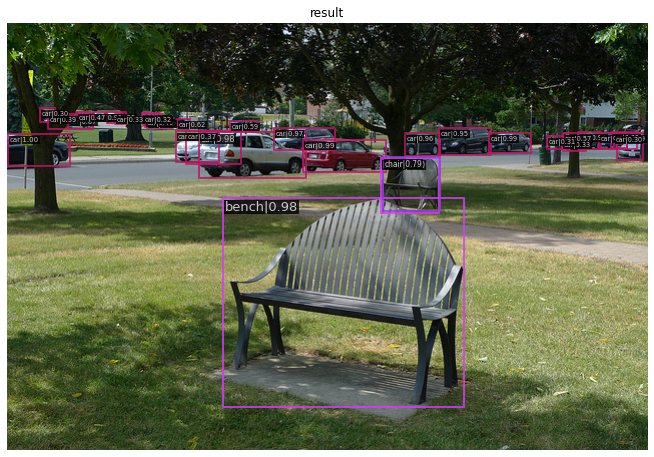

In [ ]:
# Let's plot the result
show_result_pyplot(model, img, result, score_thr=0.3)

### 2.7 Copy/download KITTI dataset into appropriate directory mmDetection folders 

In [ ]:
# download, decompress the kitti data
!mkdir /content/kitti/
!mkdir /content/kitti/training
!mkdir /content/kitti/training/image_2
!mkdir /content/kitti/training/label_2

!cp -r /content/drive/MyDrive/CMPE249_HW4/kitti/images/training/image_2/* /content/kitti/training/image_2
!cp -r /content/drive/MyDrive/CMPE249_HW4/kitti/labels/training/label_2/* /content/kitti/training/label_2
!cp /content/drive/MyDrive/CMPE249_HW4/kitti/train.txt /content/kitti/
!cp /content/drive/MyDrive/CMPE249_HW4/kitti/val.txt /content/kitti

### 2.8 Verify download of dataset by examining an image

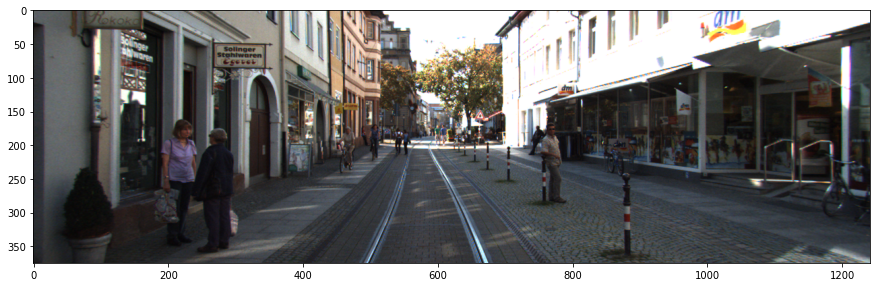

In [ ]:
# Let's take a look at the dataset image
import mmcv
import matplotlib.pyplot as plt

img = mmcv.imread('/content/kitti/training/image_2/000073.png')
plt.figure(figsize=(15, 10))
plt.imshow(mmcv.bgr2rgb(img))
plt.show()

In [ ]:
# Check the label of a single image - I chose the same image as above
!cat /content/kitti/training/label_2/000073.txt

Pedestrian 0.00 0 -2.62 237.23 173.70 312.33 365.33 1.58 0.66 0.53 -2.99 1.60 6.32 -3.05
Pedestrian 0.00 1 0.80 189.46 158.23 256.19 356.44 1.70 0.61 0.51 -3.62 1.58 6.54 0.31
Pedestrian 0.00 0 0.45 752.95 164.08 791.19 288.78 1.75 0.63 0.51 2.28 1.63 10.51 0.65
Cyclist 0.00 0 1.78 444.66 170.48 485.70 241.86 1.64 0.57 2.00 -3.55 1.60 17.61 1.58
Cyclist 0.00 0 1.65 494.34 168.08 517.01 223.73 1.80 0.60 1.85 -3.54 1.66 24.31 1.51
Pedestrian 0.00 0 -2.07 546.73 177.07 560.52 214.88 1.53 0.61 0.73 -2.41 1.71 29.83 -2.15
Pedestrian 0.00 0 -2.02 535.68 174.41 549.63 214.38 1.61 0.54 0.87 -2.86 1.68 29.55 -2.12
DontCare -1 -1 -10 596.02 166.69 615.85 203.19 -1 -1 -1 -1000 -1000 -1000 -10


### 2.9 Function defining custom dataset (KITTI) attributes

In [ ]:
import copy
import os.path as osp

import mmcv
import numpy as np

from mmdet.datasets.builder import DATASETS
from mmdet.datasets.custom import CustomDataset

@DATASETS.register_module()
class KittiDataset(CustomDataset):

    CLASSES = ('Car', 'Pedestrian', 'Cyclist')

    def load_annotations(self, ann_file):
        cat2label = {k: i for i, k in enumerate(self.CLASSES)}
        # load image list from file
        image_list = mmcv.list_from_file(self.ann_file)
    
        data_infos = []
        # convert annotations to middle format
        for image_id in image_list:
            filename = f'{self.img_prefix}/{image_id}.png'
            image = mmcv.imread(filename)
            height, width = image.shape[:2]
    
            data_info = dict(filename=f'{image_id}.png', width=width, height=height)
    
            # load annotations
            label_prefix = self.img_prefix.replace('image_2', 'label_2')
            lines = mmcv.list_from_file(osp.join(label_prefix, f'{image_id}.txt'))
    
            content = [line.strip().split(' ') for line in lines]
            bbox_names = [x[0] for x in content]
            bboxes = [[float(info) for info in x[4:8]] for x in content]
    
            gt_bboxes = []
            gt_labels = []
            gt_bboxes_ignore = []
            gt_labels_ignore = []
    
            # filter 'DontCare'
            for bbox_name, bbox in zip(bbox_names, bboxes):
                if bbox_name in cat2label:
                    gt_labels.append(cat2label[bbox_name])
                    gt_bboxes.append(bbox)
                else:
                    gt_labels_ignore.append(-1)
                    gt_bboxes_ignore.append(bbox)

            data_anno = dict(
                bboxes=np.array(gt_bboxes, dtype=np.float32).reshape(-1, 4),
                labels=np.array(gt_labels, dtype=np.long),
                bboxes_ignore=np.array(gt_bboxes_ignore,
                                       dtype=np.float32).reshape(-1, 4),
                labels_ignore=np.array(gt_labels_ignore, dtype=np.long))

            data_info.update(ann=data_anno)
            data_infos.append(data_info)

        return data_infos

### 2.10 Set up model config for KITTI dataset

In [ ]:
from mmcv import Config
cfg = Config.fromfile('./configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_1x_coco.py')

In [ ]:
from mmdet.apis import set_random_seed

# Modify dataset type and path
cfg.dataset_type = 'KittiDataset'
cfg.data_root = 'kitti'

cfg.data.test.type = 'KittiDataset'
cfg.data.test.data_root = 'kitti'
cfg.data.test.ann_file = 'train.txt'
cfg.data.test.img_prefix = 'training/image_2'

cfg.data.train.type = 'KittiDataset'
cfg.data.train.data_root = 'kitti'
cfg.data.train.ann_file = 'train.txt'
cfg.data.train.img_prefix = 'training/image_2'

cfg.data.val.type = 'KittiDataset'
cfg.data.val.data_root = 'kitti'
cfg.data.val.ann_file = 'val.txt'
cfg.data.val.img_prefix = 'training/image_2'

# modify num classes of the model in box head
cfg.model.roi_head.bbox_head.num_classes = 3
# If we need to finetune a model based on a pre-trained detector, we need to
# use load_from to set the path of checkpoints.
cfg.load_from = '/content/mmdetection/checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth'

# Set up working dir to save files and logs.
cfg.work_dir = './tutorial_exps'

# The original learning rate (LR) is set for 8-GPU training.
# We divide it by 8 since we only use one GPU.
cfg.optimizer.lr = 0.02 / 8
cfg.lr_config.warmup = None
cfg.log_config.interval = 10

# Change the evaluation metric since we use customized dataset.
cfg.evaluation.metric = 'mAP'
# We can set the evaluation interval to reduce the evaluation times
cfg.evaluation.interval = 12
# We can set the checkpoint saving interval to reduce the storage cost
cfg.checkpoint_config.interval = 12

# Set seed thus the results are more reproducible
cfg.seed = 0
set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# We can also use tensorboard to log the training process
cfg.log_config.hooks = [
    dict(type='TextLoggerHook'),
    dict(type='TensorboardLoggerHook')]

cfg.device='cuda' 

# We can initialize the logger for training and have a look
# at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
model = dict(
    type='FasterRCNN',
    backbone=dict(
        type='ResNet',
        depth=50,
        num_stages=4,
        out_indices=(0, 1, 2, 3),
        frozen_stages=1,
        norm_cfg=dict(type='BN', requires_grad=False),
        norm_eval=True,
        style='caffe',
        init_cfg=dict(
            type='Pretrained',
            checkpoint='open-mmlab://detectron2/resnet50_caffe')),
    neck=dict(
        type='FPN',
        in_channels=[256, 512, 1024, 2048],
        out_channels=256,
        num_outs=5),
    rpn_head=dict(
        type='RPNHead',
        in_channels=256,
        feat_channels=256,
        anchor_generator=dict(
            type='AnchorGenerator',
            scales=[8],
            ratios=[0.5, 1.0, 2.0],
            strides=[4, 8, 16, 32, 64]),
        bbox_coder=dict(
            type='DeltaXYWHBBoxCoder',
            target_means=[0.0, 0.0, 0.0, 0.0],
            target_stds=[1.0, 1.0, 1.0, 1.0]),
        loss_cls=dict(
            type='Cro

In [ ]:
%cd /content/
!pwd

/content
/content


### 2.11 Train the detector

In [ ]:
from mmdet.datasets import build_dataset
from mmdet.models import build_detector
from mmdet.apis import train_detector


# Build dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_detector(cfg.model)
# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_detector(model, datasets, cfg, distributed=False, validate=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:53: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int` for which `np.compat.long` is itself an alias. Doing this will not modify any behaviour and is safe. When replacing `np.long`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:56: DeprecationWarning: `np.long` is a deprecated alias for `np.compat.long`. To silence this warning, use `np.compat.long` by itself. In the likely event your code does not need to work on Python 2 you can use the builtin `int`

[>>>>>>>>>>>>>>>>>>>>>>>>>>] 3769/3769, 17.5 task/s, elapsed: 215s, ETA:     0s
---------------iou_thr: 0.5---------------


2022-08-19 02:41:00,037 - mmdet - INFO - 
+------------+-------+-------+--------+-------+
| class      | gts   | dets  | recall | ap    |
+------------+-------+-------+--------+-------+
| Car        | 14385 | 17884 | 0.901  | 0.865 |
| Pedestrian | 2280  | 3303  | 0.706  | 0.633 |
| Cyclist    | 893   | 1332  | 0.605  | 0.510 |
+------------+-------+-------+--------+-------+
| mAP        |       |       |        | 0.669 |
+------------+-------+-------+--------+-------+
2022-08-19 02:41:00,042 - mmdet - INFO - Epoch(val) [12][3769]	AP50: 0.6690, mAP: 0.6693


### 2.12 Perform Inference on the trained model

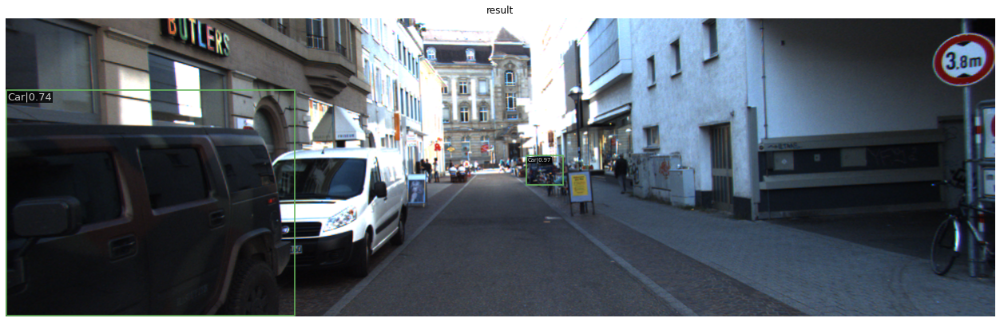

In [ ]:
img = mmcv.imread('/content/kitti/training/image_2/000911.png')

model.cfg = cfg
result = inference_detector(model, img)
show_result_pyplot(model, img, result)

In [ ]:
!pwd
%cd /content/mmdetection/

/content
/content/mmdetection


In [ ]:
!wget -c http://images.cocodataset.org/annotations/annotations_trainval2017.zip
!unzip -o annotations_trainval2017.zip

--2022-08-19 02:41:02--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 54.231.163.89
Connecting to images.cocodataset.org (images.cocodataset.org)|54.231.163.89|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  33.1MB/s    in 7.8s    

2022-08-19 02:41:10 (30.8 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

Archive:  annotations_trainval2017.zip
  inflating: annotations/instances_train2017.json  
  inflating: annotations/instances_val2017.json  
  inflating: annotations/captions_train2017.json  
  inflating: annotations/captions_val2017.json  
  inflating: annotations/person_keypoints_train2017.json  
  inflating: annotations/person_keypoints_val2017.json  


In [ ]:
! wget http://images.cocodataset.org/zips/val2017.zip
!unzip -o val2017.zip

Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000212226.jpg  
 extracting: val2017/000000231527.jpg  
 extracting: val2017/000000578922.jpg  
 extracting: val2017/000000062808.jpg  
 extracting: val2017/000000119038.jpg  
 extracting: val2017/000000114871.jpg  
 extracting: val2017/000000463918.jpg  
 extracting: val2017/000000365745.jpg  
 extracting: val2017/000000320425.jpg  
 extracting: val2017/000000481404.jpg  
 extracting: val2017/000000314294.jpg  
 extracting: val2017/000000335328.jpg  
 extracting: val2017/000000513688.jpg  
 extracting: val2017/000000158548.jpg  
 extracting: val2017/000000132116.jpg  
 extracting: val2017/000000415238.jpg  
 extracting: val2017/000000321333.jpg  
 extracting: val2017/000000081738.jpg  
 extracting: val2017/000000577584.jpg  
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/00000011

In [ ]:
!mkdir /content/mmdetection/data/
!mkdir /content/mmdetection/data/coco
!mv /content/mmdetection/annotations /content/mmdetection/data/coco/
!mv /content/mmdetection/val2017 /content/mmdetection/data/coco/

mkdir: cannot create directory ‘/content/mmdetection/data/’: File exists
mkdir: cannot create directory ‘/content/mmdetection/data/coco’: File exists
mv: cannot stat '/content/mmdetection/annotations': No such file or directory
mv: cannot stat '/content/mmdetection/val2017': No such file or directory


### 2.13 COCO Evaluation - note that there is an issue or bug with my implementation as this occasionally (often) causes Colab to  crash. As an alternative, I used Tensorboard to examine model performance

In [ ]:
!pwd

/content/mmdetection


In [ ]:
# out: results.bbox.json and results.segm.json
!python /content/mmdetection/tools/test.py \
/content/mmdetection/configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py \
/content/mmdetection/checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
--eval bbox segm
#--eval-options "jsonfile_prefix=/content/mmdetection/results/"

/content/mmdetection/mmdet/utils/setup_env.py:39: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting OMP_NUM_THREADS environment variable for each process '
/content/mmdetection/mmdet/utils/setup_env.py:49: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting MKL_NUM_THREADS environment variable for each process '
loading annotations into memory...
Done (t=0.58s)
creating index...
index created!
load checkpoint from local path: /content/mmdetection/checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth
[                                                  ] 0/5000, elapsed: 0s, ETA:/usr/local/lib/python3

In [ ]:
# out: results.bbox.json and results.segm.json
!python /content/mmdetection/tools/test.py \
/content/mmdetection/configs/faster_rcnn/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco.py \
/content/mmdetection/checkpoints/faster_rcnn_r50_caffe_fpn_mstrain_3x_coco_20210526_095054-1f77628b.pth \
--format-only \
--options "jsonfile_prefix=/content/mmdetection/results"

/content/mmdetection/tools/test.py:116: UserWarning: --options is deprecated in favor of --eval-options
  warnings.warn('--options is deprecated in favor of --eval-options')
/content/mmdetection/mmdet/utils/setup_env.py:39: UserWarning: Setting OMP_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting OMP_NUM_THREADS environment variable for each process '
/content/mmdetection/mmdet/utils/setup_env.py:49: UserWarning: Setting MKL_NUM_THREADS environment variable for each process to be 1 in default, to avoid your system being overloaded, please further tune the variable for optimal performance in your application as needed.
  f'Setting MKL_NUM_THREADS environment variable for each process '
loading annotations into memory...
Done (t=0.54s)
creating index...
index created!
load checkpoint from local path: /content/mmdetection/checkpoin

In [ ]:
%cd /content/mmdetection/

/content/mmdetection


In [ ]:
!python /content/mmdetection/tools/analysis_tools/coco_error_analysis.py \
/content/mmdetection/results.bbox.json --ann /content/mmdetection/data/coco/annotations/instances_val2017.json \

-------------create \-----------------
loading annotations into memory...
Done (t=0.65s)
creating index...
index created!
Loading and preparing results...
DONE (t=1.59s)
creating index...
index created!
-------------create \/bbox/-----------------
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=22.70s).
Accumulating evaluation results...
DONE (t=1.28s).
--------------analyzing 1-person---------------
--------------analyzing 2-bicycle---------------
--------------analyzing 3-car---------------
--------------analyzing 4-motorcycle---------------
--------------analyzing 5-airplane---------------
--------------analyzing 6-bus---------------
--------------analyzing 7-train---------------
--------------analyzing 8-truck---------------
creating index...
index created!
--------------analyzing 9-boat---------------
creating index...
index created!
--------------analyzing 10-traffic light---------------
--------------analyzing 11-fire hydrant---------------
creating index

In [ ]:
# Tensorboard  (optional)
%load_ext tensorboard
%tensorboard --logdir /content/tutorial_exps/tf_logs/

<IPython.core.display.Javascript object>

### 2.14 Discussion

Creation of this model leveraged looking at examples from several different examples on the web. Once it was understood how the KITTI dataset needed to be referenced from the mmdetection framework, things began to get easier.

As was discussed in part I, a lot of time was spent experimenting with trying to get various configurations and examples found on the web to work. Often time challenges were met in that an example could be found, but then wasn't compatible with either the Colab environment or the SJSU HPC environement. As such, a lot of time was spent iterating on just getting something to work. Unfortunately, in this case, I was not able to get the coco metrics to work in the colab environment. For some reason, running the command causes Colab to crash. More investigation would be required to understand why.

Configuration of the model was left at default values. As such, the model trained for a total of 12 epochs, which took roughly 60 minutes to complete using the Google Colab GPU.

After training, Inference was then performed on the model using a selected image. Unlike part I, the images were labeled correctly. As mentioned in the other write up, the mislabeling is likely due to the KITTI to YOLO conversion, which was not necessary in the MMdetection framework.

In addition to the inference for just observational accuracy assessment the average precision and (MAP) were evaluated. For this model,the Average precision and map values were as follows: 

*   Car - AP = 0.863
*   Pedestrian - AP = 0.640
*   Cyclist - AP = 0.506
*   MAP = 0.669

Overall, these are better results than the YOLO model yielded. As mentioned earlier, the COCO validation assessment was crashing in the Colab environement so I was unable to run the coco metrics. However, I was able to load the Tensorboard metrics which did provide some interesting plots of the model learning rate and losses over training.

Future work for this model could modifying the model configuration to understand the impact to model performance. Additionally, addition of an accelerator to inference would be an area that could also be researched.

In conclusion, as with Part I, quite a bit of time was spent understand the command and syntax specific steps that would work within the Colab environement. This model, though using the default training values, was updated to utilize a custom dataset (KITTI dataset). The metrics of the data indicate decent results, particularly in contrast to the YOLO effort.